<a href="https://colab.research.google.com/github/khushidubeyokok/AI-ML/blob/main/05_ComputerVision/08_YOLOv11.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# YOLO
***YOLO (You Only Look Once)***: It’s a family of deep learning models for real-time object detection. Instead of scanning an image many times (like older detectors), YOLO divides it into a grid and predicts bounding boxes and class probabilities in one forward pass through a CNN. This makes it insanely fast while keeping accuracy high.


Here’s the crux of how YOLO actually works under the hood:
- The input image is resized (say 640×640) and passed through a CNN backbone
- The image is divided into an **S×S grid**, and each grid cell is responsible for predicting a fixed number of bounding boxes.
- For each box, YOLO predicts 5 key numbers: **(x, y, w, h, confidence)**. The (x, y) are relative to the grid cell, (w, h) are normalized dimensions, and confidence indicates whether an object is inside.
- On top of that, it also predicts class probabilities for each box. During training, YOLO minimizes a** multi-part loss function (localization loss for box positions, objectness loss, and classification loss)**.
- At inference, YOLO outputs thousands of candidate boxes, then applies Non-Max Suppression (NMS) to remove overlapping ones, leaving clean, high-confidence detections.

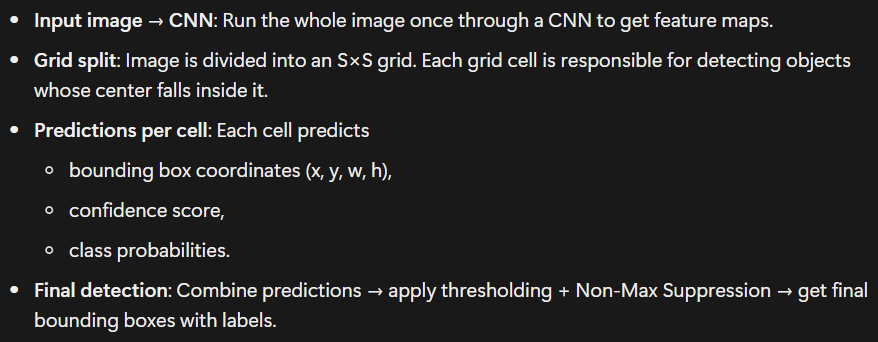

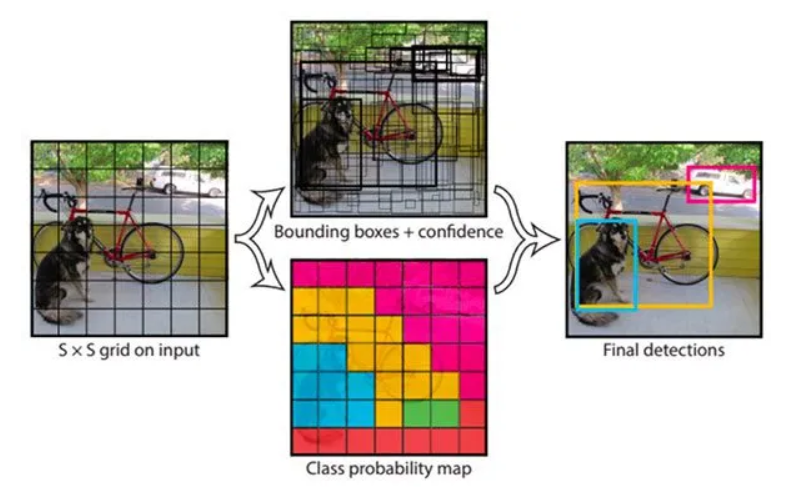

# YOLOv11

YOLOv11: The newest version, optimized for speed and accuracy. It improves training tricks, model scaling, and efficiency, so you can detect small and large objects better in both images and videos, even on edge devices.

In [22]:
!pip install ultralytics

## OBJECT DETECTION
Finds objects in an image/video and draws rectangular bounding boxes with class labels and confidence scores.


In [23]:
from ultralytics import YOLO

In [24]:
model=YOLO("yolo11n.pt")

In [31]:
import cv2
img=cv2.imread("/content/images (6).jpg")

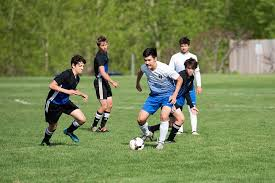

In [32]:
from google.colab.patches import cv2_imshow
cv2_imshow(img)


0: 448x640 7 persons, 1 sports ball, 19.0ms
Speed: 3.2ms preprocess, 19.0ms inference, 4.8ms postprocess per image at shape (1, 3, 448, 640)


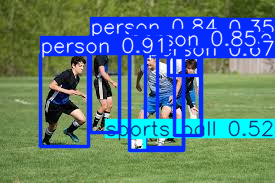

In [33]:
#Perform object detection on an image
results=model(img)
results[0].show()

In [34]:
vid_results=model("/content/8878321-hd_1080_1920_25fps.mp4",save=True)


WARNING ⚠️ 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/348) /content/8878321-hd_1080_1920_25fps.mp4: 640x384 6 persons, 3 wine glasss, 1 cup, 1 knife, 1 cake, 1 chair, 1 potted plant, 1 dining table, 54.4ms
video 1/1 (frame 2/348) /content/8878321-hd_1080_1920_25fps.mp4: 640x384 6 persons, 2 wine glasss, 1 knife, 1 cake, 1 chair, 1 potted plant, 1 dining table, 11.6ms
video 1/1 (frame 3/348) /content/8878321-hd_1080_1920_25fps.mp4: 640x384 4 persons, 3 wine glasss, 1 knife, 1 cake, 1 cha

To play the video convert to mp4

In [40]:
!ffmpeg -i /content/runs/detect/predict/8878321-hd_1080_1920_25fps.avi \
       -vcodec libx264 /content/output.mp4

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [41]:
from IPython.display import Video
Video("/content/output.mp4", embed=True)

## SEGMENTATION
Goes beyond boxes to highlight the exact pixels (mask) belonging to each detected object.

In [42]:
model2=YOLO("yolo11n-seg")

In [51]:
results=model2("/content/5-Free-Cat-Food-Samples-For-Your-Feline-Friend-jpg.webp")


image 1/1 /content/5-Free-Cat-Food-Samples-For-Your-Feline-Friend-jpg.webp: 448x640 1 cat, 12.6ms
Speed: 4.1ms preprocess, 12.6ms inference, 1.9ms postprocess per image at shape (1, 3, 448, 640)


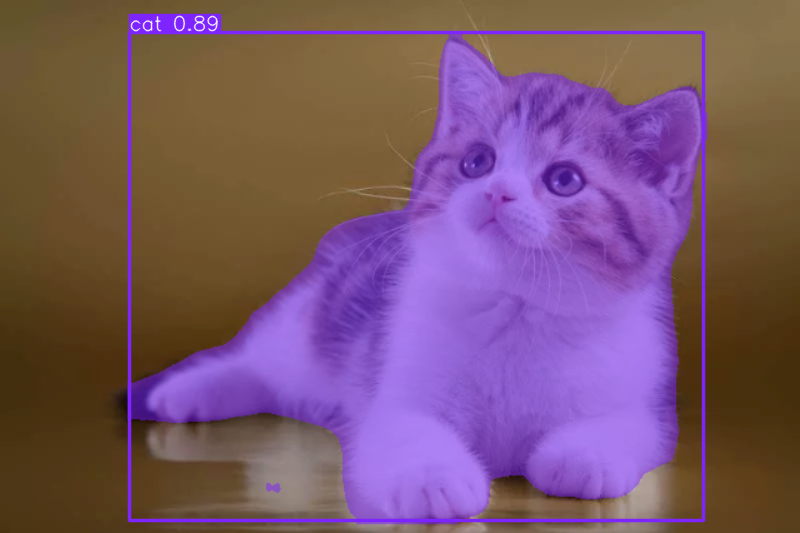

In [52]:
results[0].show()

## POSE ESTIMATION
Detects human keypoints (like head, shoulders, knees) to understand body posture or movement.

In [54]:
model3=YOLO("yolo11n-pose.pt")


image 1/1 /content/posing-sample-image_1761-t.jpg: 480x640 2 persons, 55.7ms
Speed: 3.1ms preprocess, 55.7ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


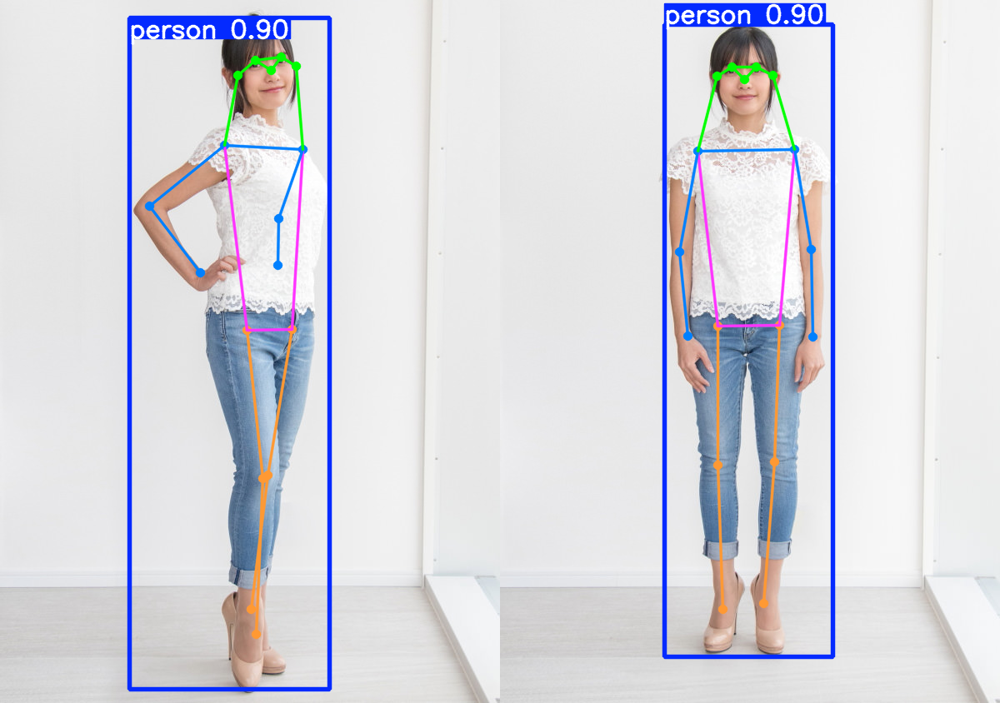

In [56]:
results=model3("/content/posing-sample-image_1761-t.jpg")
results[0].show()

## IMAGE-CLASSIFICATION
Classifies images and gives probabiltiy scores

In [57]:
model4=YOLO("yolo11n-cls.pt")


image 1/1 /content/5-Free-Cat-Food-Samples-For-Your-Feline-Friend-jpg.webp: 224x224 tabby 0.47, Persian_cat 0.17, Egyptian_cat 0.15, tiger_cat 0.13, lynx 0.02, 4.9ms
Speed: 14.1ms preprocess, 4.9ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)


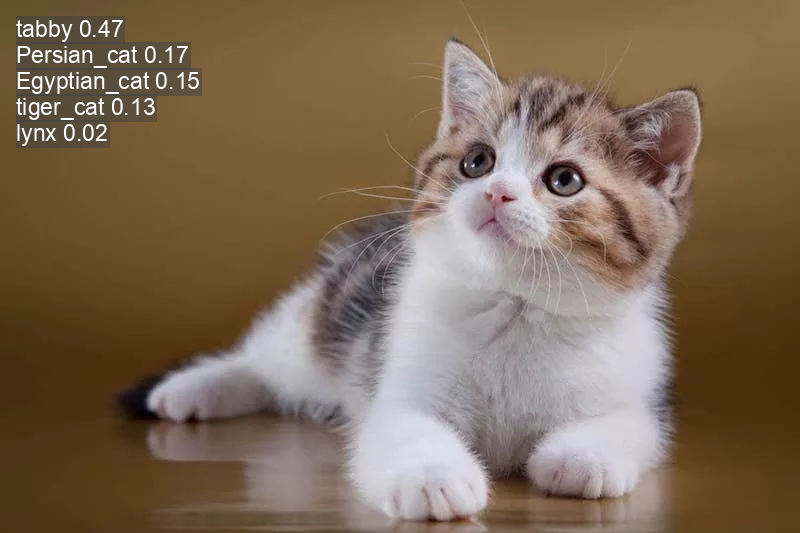

In [59]:
results=model4("/content/5-Free-Cat-Food-Samples-For-Your-Feline-Friend-jpg.webp")
results[0].show()

## ORIENTED-BOUNDING BOX
Instead of straight rectangles, it predicts rotated boxes that tightly fit angled objects (like ships, aerial objects, or documents).

In [60]:
model5=YOLO("yolo11n-obb.pt")


image 1/1 /content/Flights.jpg: 704x1024 5 planes, 70.4ms
Speed: 6.2ms preprocess, 70.4ms inference, 137.3ms postprocess per image at shape (1, 3, 704, 1024)


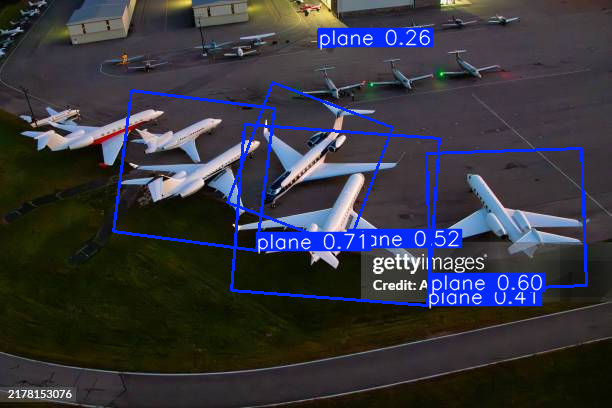

In [61]:
results=model5("/content/Flights.jpg")
results[0].show()